Keys: <KeysViewHDF5 ['imgs']>
Keys: <KeysViewHDF5 ['imgs']>
trg_idx = 0, lambda_id = 10.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/tensorboard
Loading checkpoint from ./handbag2shoes_exps/checkpoints_lambda_10.0/084001_nets_ema.ckpt...
Calculating evaluation metrics...
Number of domains: 2
Compute FID for handbag2shoes
Preparing DataLoader for the generation phase...


  0%|          | 1/376 [00:01<10:35,  1.70s/it]


RuntimeError: CUDA out of memory. Tried to allocate 296.00 MiB (GPU 0; 31.75 GiB total capacity; 1.56 GiB already allocated; 222.75 MiB free; 2.23 GiB reserved in total by PyTorch)

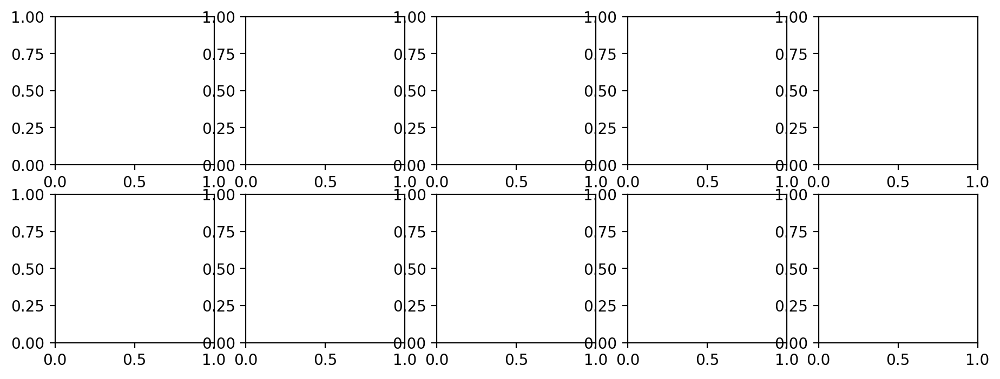

In [6]:
import os
import torch
import numpy as np
import json
from easydict import EasyDict as edict
from test_utils import load_dataset, LoaderSampler, tensor2img
from torchvision.transforms import Compose, Resize, Normalize, ToTensor
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset, DataLoader
from core.my_solver import Solver
from core.fid_score import calculate_frechet_distance
from core.my_metrics import get_Z_pushed_loader_stats, calculate_cost
import matplotlib.pyplot as plt

os.environ['CUDA_VISIBLE_DEVICES'] = "0"


DATASET1, DATASET1_PATH = 'handbag', '../../data/handbag_128.hdf5'
DATASET2, DATASET2_PATH = 'shoes', '../../data/shoes_128.hdf5'

IMG_SIZE = 128

device = 'cuda'
input_shape = (3, IMG_SIZE, IMG_SIZE)

torch.manual_seed(0)
np.random.seed(0)

train_loader_a, test_loader_a = load_dataset(DATASET1, DATASET1_PATH,
                                             img_size=IMG_SIZE, batch_size=32)
train_loader_b, test_loader_b = load_dataset(DATASET2, DATASET2_PATH,
                                             img_size=IMG_SIZE, batch_size=32)

n_batches = min(len(train_loader_a), len(train_loader_b))

X_sampler = LoaderSampler(train_loader_a, device=device)
X_test_sampler = LoaderSampler(test_loader_a, device=device)
Y_sampler = LoaderSampler(train_loader_b, device=device)
Y_test_sampler = LoaderSampler(test_loader_b, device=device)

torch.manual_seed(0)
np.random.seed(0)
X_fixed = X_sampler.sample(12)
Y_fixed = Y_sampler.sample(12)

X_test_fixed = X_test_sampler.sample(12)
Y_test_fixed = Y_test_sampler.sample(12)

indices = [0, 243, 947, 1030, 906]
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
                
# lambdas_arr = [0.0, 1.0, 10.0, 50.0, 100., 200., 500.]
# best_iters = [64001, 96001, 84001, 92001, 88001, 92001, 88001]
lambdas_arr = [10.0]
best_iters = [84001]
                
fig, axes = plt.subplots(1 + len(lambdas_arr), len(indices), figsize=(2*len(indices) + 1, 2*len(lambdas_arr) + 2), dpi=200)


for k, lambda_val in enumerate(lambdas_arr):
    args = edict({
    'img_size': 128,
    'num_domains': 2,
    'latent_dim': 16,
    'hidden_dim': 512,
    'style_dim': 64,
    'lambda_reg': 1.0,
    'lambda_cyc': 1.0,
    'lambda_sty': 1.0,
    'lambda_ds': 1.0,
    'lambda_id': lambda_val,
    'ds_iter': 100000,
    'w_hpf': -1.0,
    'randcrop_prob': 0.5,
    'total_iters': 100000,
    'resume_iter': 0,
    'batch_size': 16,
    'val_batch_size': 32,
    'lr': 1e-4,
    'f_lr': 1e-6,
    'beta1': 0.0,
    'beta2': 0.99,
    'weight_decay': 1e-4,
    'num_outs_per_domain': 10,
    'mode': 'eval',
    'num_workers': 4,
    'seed': 777,
    'val_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test',
    'sample_dir': 'expr/samples',
    'checkpoint_dir': f'./handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'eval_dir': 'expr/eval',
    'result_dir': 'expr/results',
    'src_dir': 'assets/representative/celeba_hq/src',
    'ref_dir': 'assets/representative/celeba_hq/ref',
    'inp_dir': 'assets/representative/custom/female',
    'out_dir': 'assets/representative/celeba_hq/src/female',
    'wing_path': 'expr/checkpoints/wing.ckpt',
    'lm_path': 'expr/checkpoints/celeba_lm_mean.npz',
    'print_every': 10,
    'sample_every': 4000,
    'save_every': 4000,
    'eval_every': 4000,
    'device': 0,

    'target_dataset': 'shoes',
    'OUTPUT_PATH': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'domains': {
        'source': 'handbag',
        'target': 'shoes',
    },
    'train_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/handbag',
    'train_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/shoes',
    'test_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/handbag',
    'test_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/shoes',

    'n_epochs': 1
    })
                
    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()

    final_trg_index = -1
    final_src_index = -1

    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                final_trg_index = trg_idx
                final_src_index = src_idx

    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()
    num_domains = len(domains)
    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                print(f"trg_idx = {trg_idx}, trg_domain = {trg_domain}, src_domain = {src_domain}")
                break
        break

    print(f"trg_idx = {trg_idx}, lambda_id = {args.lambda_id}")
                
    solver = Solver(args)
    iteration = best_iters[k]
    solver._load_checkpoint(iteration)
    
    nets_ema = solver.nets_ema
    nets_ema.mapping_network.eval()
    nets_ema.generator.eval()
    
    torch.manual_seed(0xBADBEEF)
    np.random.seed(0xBADBEEF)
    
    num_calculation_fid = 1
    fid_values = []
    l2_cost_values = []
    l1_cost_values = []

    for i in range(num_calculation_fid):
        mu, sigma = get_Z_pushed_loader_stats(nets_ema, args.domains, args, device,
                                              batch_size=37, n_epochs=args.n_epochs)
        fid = calculate_frechet_distance(solver.mu_data, solver.sigma_data, mu, sigma)
        print(f"FID = {fid}")
        fid_values.append(fid)
        
        l1_cost = calculate_cost(nets_ema, args, trg_idx, X_test_sampler.loader, device,
                   cost_type='l1', verbose=True)
        print(f"l1 = {l1_cost}")
        l1_cost_values.append(l1_cost)
        
        l2_cost = calculate_cost(nets_ema, args, trg_idx, X_test_sampler.loader, device,
                   cost_type='mse', verbose=True)
        print(f"l2 = {l2_cost}")
        l2_cost_values.append(l2_cost)
    
    fid_values = np.array(fid_values)
    fid_mean = np.mean(fid_values)
    fid_std = np.std(fid_values)
    print("--------")
    print(f"Mean FID = {fid_mean}")
    print(f"Std FID = {fid_std}")
    l2_cost_values = np.array(l2_cost_values)
    l2_cost_mean = np.mean(l2_cost_values)
    l2_cost_std = np.std(l2_cost_values)
    print("--------")
    print(f"Mean l2 cost = {l2_cost_mean}")
    print(f"Std l2 cost = {l2_cost_std}")
    l1_cost_values = np.array(l1_cost_values)
    l1_cost_mean = np.mean(l1_cost_values)
    l1_cost_std = np.std(l1_cost_values)
    print("--------")
    print(f"Mean l1 cost = {l1_cost_mean}")
    print(f"Std l1 cost = {l1_cost_std}")

    torch.manual_seed(0xBADBEEF)
    np.random.seed(0xBADBEEF)

    num_examples = 1
    Y_test_fakes = []

    Y_test_fakes = []

    for v in range(num_examples):
        N = X.size(0)
        x_src = X.to(device)
        y_trg = torch.tensor([final_trg_index] * N).to(device)
        masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

        z_trg = torch.randn(N, args.latent_dim).to(device)
        s_trg = nets_ema.mapping_network(z_trg, y_trg)
        x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks).detach()

        fake_Y_test_numpy = tensor2img(x_fake)
        Y_test_fakes.append(fake_Y_test_numpy)

    real_X_test_numpy = tensor2img(X_test_fixed)
    real_Y_test_numpy = tensor2img(Y_test_fixed)
    
    real_X_test_numpy = tensor2img(X)

    X_tensor = real_X_test_numpy

    for j in range(len(indices)):
        axes[0][j].imshow(X_tensor[j])
        axes[0][j].get_xaxis().set_visible(False)
        axes[0][j].set_yticks([])

        axes[k + 1][j].imshow(fake_Y_test_numpy[j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])

    axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)
    title = r'\widehat{T}(x)'
    axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

    fig.tight_layout(pad=0.001)    
                
plt.savefig('best_fid_models_starganv2_handbag2shoes_128_all_lambdas.png')
plt.show()

Keys: <KeysViewHDF5 ['imgs']>
Keys: <KeysViewHDF5 ['imgs']>
trg_idx = 0, lambda_id = 0.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/tensorboard
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/064001_nets.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/064001_nets_ema.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/064001_optims.ckpt...
trg_idx = 0, lambda_id = 10.0
Number of parameters of generator: 33632003
Number of parameter

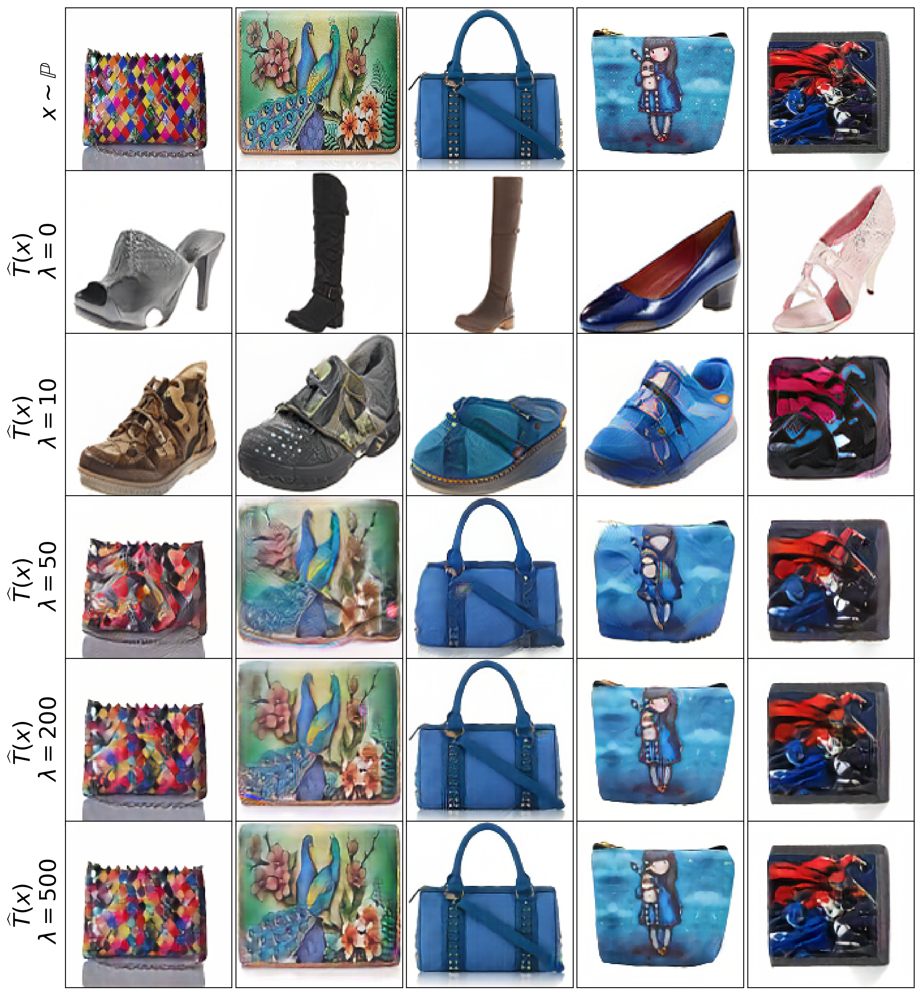

In [5]:
import os
import torch
import numpy as np
import json
from easydict import EasyDict as edict
from test_utils import load_dataset, LoaderSampler, tensor2img
from torchvision.transforms import Compose, Resize, Normalize, ToTensor
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset, DataLoader
from core.my_solver import Solver
from core.fid_score import calculate_frechet_distance
from core.my_metrics import get_Z_pushed_loader_stats, calculate_cost
import matplotlib.pyplot as plt

os.environ['CUDA_VISIBLE_DEVICES'] = "0"


DATASET1, DATASET1_PATH = 'handbag', '../data/handbag_128.hdf5'
DATASET2, DATASET2_PATH = 'shoes', '../data/shoes_128.hdf5'

IMG_SIZE = 128

filename = 'stats/{}_{}_test.json'.format(DATASET2, IMG_SIZE)
with open(filename, 'r') as fp:
    data_stats = json.load(fp)
    mu_data, sigma_data = data_stats['mu'], data_stats['sigma']
del data_stats

device = 'cuda'
input_shape = (3, IMG_SIZE, IMG_SIZE)

torch.manual_seed(0)
np.random.seed(0)

train_loader_a, test_loader_a = load_dataset(DATASET1, DATASET1_PATH,
                                             img_size=IMG_SIZE, batch_size=32)
train_loader_b, test_loader_b = load_dataset(DATASET2, DATASET2_PATH,
                                             img_size=IMG_SIZE, batch_size=32)

n_batches = min(len(train_loader_a), len(train_loader_b))

X_sampler = LoaderSampler(train_loader_a, device=device)
X_test_sampler = LoaderSampler(test_loader_a, device=device)
Y_sampler = LoaderSampler(train_loader_b, device=device)
Y_test_sampler = LoaderSampler(test_loader_b, device=device)

torch.manual_seed(0)
np.random.seed(0)
X_fixed = X_sampler.sample(12)
Y_fixed = Y_sampler.sample(12)

X_test_fixed = X_test_sampler.sample(12)
Y_test_fixed = Y_test_sampler.sample(12)

indices = [0, 243, 947, 1030, 906]
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
                
# lambdas_arr = [0.0, 1.0, 10.0, 50.0, 100., 200., 500.]
# best_iters = [64001, 96001, 84001, 92001, 88001, 92001, 88001]
lambdas_arr = [0.0, 10.0, 50.0, 200., 500.]
best_iters = [64001, 84001, 92001, 92001, 88001]
                
fig, axes = plt.subplots(1 + len(lambdas_arr), len(indices), figsize=(2*len(indices) + 1, 2*len(lambdas_arr) + 2), dpi=200)


for k, lambda_val in enumerate(lambdas_arr):
    args = edict({
    'img_size': 128,
    'num_domains': 2,
    'latent_dim': 16,
    'hidden_dim': 512,
    'style_dim': 64,
    'lambda_reg': 1.0,
    'lambda_cyc': 1.0,
    'lambda_sty': 1.0,
    'lambda_ds': 1.0,
    'lambda_id': lambda_val,
    'ds_iter': 100000,
    'w_hpf': -1.0,
    'randcrop_prob': 0.5,
    'total_iters': 100000,
    'resume_iter': 0,
    'batch_size': 16,
    'val_batch_size': 32,
    'lr': 1e-4,
    'f_lr': 1e-6,
    'beta1': 0.0,
    'beta2': 0.99,
    'weight_decay': 1e-4,
    'num_outs_per_domain': 10,
    'mode': 'train',
    'num_workers': 4,
    'seed': 777,
    'train_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train',
    'val_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test',
    'sample_dir': 'expr/samples',
    'checkpoint_dir': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'eval_dir': 'expr/eval',
    'result_dir': 'expr/results',
    'src_dir': 'assets/representative/celeba_hq/src',
    'ref_dir': 'assets/representative/celeba_hq/ref',
    'inp_dir': 'assets/representative/custom/female',
    'out_dir': 'assets/representative/celeba_hq/src/female',
    'wing_path': 'expr/checkpoints/wing.ckpt',
    'lm_path': 'expr/checkpoints/celeba_lm_mean.npz',
    'print_every': 10,
    'sample_every': 4000,
    'save_every': 4000,
    'eval_every': 4000,
    'device': 0,

    'target_dataset': 'shoes',
    'OUTPUT_PATH': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'domains': {
        'source': 'handbag',
        'target': 'shoes',
    },
    'train_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/handbag',
    'train_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/shoes',
    'test_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/handbag',
    'test_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/shoes',

    'n_epochs': 1
    })
                
    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()

    final_trg_index = -1
    final_src_index = -1

    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                final_trg_index = trg_idx
                final_src_index = src_idx

    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()
    num_domains = len(domains)
    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                print(f"trg_idx = {trg_idx}, trg_domain = {trg_domain}, src_domain = {src_domain}")
                break
        break

    print(f"trg_idx = {trg_idx}, lambda_id = {args.lambda_id}")
                
    solver = Solver(args)
    iteration = best_iters[k]
    solver._load_checkpoint(iteration)
    
    nets_ema = solver.nets_ema
    nets_ema.mapping_network.eval()
    nets_ema.generator.eval()

    torch.manual_seed(0xBADBEEF)
    np.random.seed(0xBADBEEF)

    num_examples = 1
    Y_test_fakes = []

    Y_test_fakes = []

    for v in range(num_examples):
        N = X.size(0)
        x_src = X.to(device)
        y_trg = torch.tensor([final_trg_index] * N).to(device)
        masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

        z_trg = torch.randn(N, args.latent_dim).to(device)
        s_trg = nets_ema.mapping_network(z_trg, y_trg)
        x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks).detach()

        fake_Y_test_numpy = tensor2img(x_fake)
        Y_test_fakes.append(fake_Y_test_numpy)

    real_X_test_numpy = tensor2img(X_test_fixed)
    real_Y_test_numpy = tensor2img(Y_test_fixed)
    
    real_X_test_numpy = tensor2img(X)

    X_tensor = real_X_test_numpy

    for j in range(len(indices)):
        axes[0][j].imshow(X_tensor[j])
        axes[0][j].get_xaxis().set_visible(False)
        axes[0][j].set_yticks([])

        axes[k + 1][j].imshow(fake_Y_test_numpy[j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])

    axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)
    title = r'\widehat{T}(x)'
    axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

    fig.tight_layout(pad=0.001)    
                
plt.savefig('best_fid_models_starganv2_handbag2shoes_128_all_lambdas.png')
plt.show()

#### 444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444444k4

Keys: <KeysViewHDF5 ['imgs']>
Keys: <KeysViewHDF5 ['imgs']>
trg_idx = 0, lambda_id = 10.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/tensorboard
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_nets.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_nets_ema.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_optims.ckpt...
Calculating evaluation metrics...
Number of domains: 2
Compute FID for handbag2shoes, tr

100%|██████████| 376/376 [01:21<00:00,  4.60it/s]


FID = 22.11789059387945


434it [01:01,  7.04it/s]


l1 = 0.10931308359191204


434it [01:00,  7.15it/s]


l2 = 0.054836583720843914
Calculating evaluation metrics...
Number of domains: 2
Compute FID for handbag2shoes, trg_idx = 1, trg_domain = shoes
Preparing DataLoader for the generation phase...


100%|██████████| 376/376 [01:22<00:00,  4.58it/s]


FID = 22.444284221002675


434it [01:04,  6.71it/s]


l1 = 0.1094518624832459


434it [01:03,  6.84it/s]


l2 = 0.05481602995084321
Calculating evaluation metrics...
Number of domains: 2
Compute FID for handbag2shoes, trg_idx = 1, trg_domain = shoes
Preparing DataLoader for the generation phase...


100%|██████████| 376/376 [01:20<00:00,  4.67it/s]


FID = 22.261838331595072


434it [01:17,  5.63it/s]


l1 = 0.10947106315134994


434it [01:05,  6.59it/s]


l2 = 0.05497569746519585
Calculating evaluation metrics...
Number of domains: 2
Compute FID for handbag2shoes, trg_idx = 1, trg_domain = shoes
Preparing DataLoader for the generation phase...


100%|██████████| 376/376 [01:22<00:00,  4.58it/s]


FID = 22.17855492466572


434it [01:01,  7.07it/s]


l1 = 0.10962018036436849


434it [01:04,  6.75it/s]


l2 = 0.05483504143562603
Calculating evaluation metrics...
Number of domains: 2
Compute FID for handbag2shoes, trg_idx = 1, trg_domain = shoes
Preparing DataLoader for the generation phase...


100%|██████████| 376/376 [01:21<00:00,  4.63it/s]


FID = 22.319732149409447


434it [01:02,  6.99it/s]


l1 = 0.10952545909931076


434it [01:01,  7.04it/s]


l2 = 0.05484869097659897
--------
Mean FID = 22.26446004411047
Std FID = 0.1133674617193962
--------
Mean l2 cost = 0.0548624087098216
Std l2 cost = 5.760105092093861e-05
--------
Mean l1 cost = 0.10947632973803742
Std l1 cost = 0.00010038165624468166


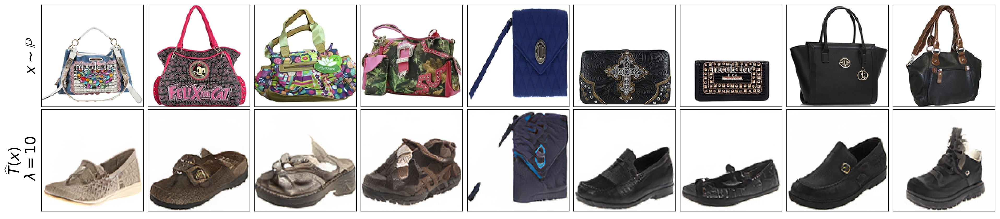

In [4]:
import os
import torch
import numpy as np
import json
from easydict import EasyDict as edict
from test_utils import load_dataset, LoaderSampler, tensor2img
from torchvision.transforms import Compose, Resize, Normalize, ToTensor
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset, DataLoader
from core.my_solver import Solver
from core.fid_score import calculate_frechet_distance
from core.my_metrics import get_Z_pushed_loader_stats, calculate_cost
import matplotlib.pyplot as plt

os.environ['CUDA_VISIBLE_DEVICES'] = "0"


DATASET1, DATASET1_PATH = 'handbag', '../data/handbag_128.hdf5'
DATASET2, DATASET2_PATH = 'shoes', '../data/shoes_128.hdf5'

IMG_SIZE = 128

filename = 'stats/{}_{}_test.json'.format(DATASET2, IMG_SIZE)
with open(filename, 'r') as fp:
    data_stats = json.load(fp)
    mu_data, sigma_data = data_stats['mu'], data_stats['sigma']
del data_stats

device = 'cuda'
input_shape = (3, IMG_SIZE, IMG_SIZE)

torch.manual_seed(0)
np.random.seed(0)

train_loader_a, test_loader_a = load_dataset(DATASET1, DATASET1_PATH,
                                             img_size=IMG_SIZE, batch_size=32)
train_loader_b, test_loader_b = load_dataset(DATASET2, DATASET2_PATH,
                                             img_size=IMG_SIZE, batch_size=32)

n_batches = min(len(train_loader_a), len(train_loader_b))

X_sampler = LoaderSampler(train_loader_a, device=device)
X_test_sampler = LoaderSampler(test_loader_a, device=device)
Y_sampler = LoaderSampler(train_loader_b, device=device)
Y_test_sampler = LoaderSampler(test_loader_b, device=device)

torch.manual_seed(0)
np.random.seed(0)
X_fixed = X_sampler.sample(12)
Y_fixed = Y_sampler.sample(12)

X_test_fixed = X_test_sampler.sample(12)
Y_test_fixed = Y_test_sampler.sample(12)

indices = [i for i in range(1, 10)]
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
                
lambdas_arr = [10.0]
best_iters = [84001]
                
fig, axes = plt.subplots(1 + len(lambdas_arr), len(indices), figsize=(2*len(indices) + 1, 2*len(lambdas_arr) + 2), dpi=200)


for k, lambda_val in enumerate(lambdas_arr):
    args = edict({
    'img_size': 128,
    'num_domains': 2,
    'latent_dim': 16,
    'hidden_dim': 512,
    'style_dim': 64,
    'lambda_reg': 1.0,
    'lambda_cyc': 1.0,
    'lambda_sty': 1.0,
    'lambda_ds': 1.0,
    'lambda_id': lambda_val,
    'ds_iter': 100000,
    'w_hpf': -1.0,
    'randcrop_prob': 0.5,
    'total_iters': 100000,
    'resume_iter': 0,
    'batch_size': 16,
    'val_batch_size': 32,
    'lr': 1e-4,
    'f_lr': 1e-6,
    'beta1': 0.0,
    'beta2': 0.99,
    'weight_decay': 1e-4,
    'num_outs_per_domain': 10,
    'mode': 'train',
    'num_workers': 4,
    'seed': 777,
    'train_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train',
    'val_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test',
    'sample_dir': 'expr/samples',
    'checkpoint_dir': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'eval_dir': 'expr/eval',
    'result_dir': 'expr/results',
    'src_dir': 'assets/representative/celeba_hq/src',
    'ref_dir': 'assets/representative/celeba_hq/ref',
    'inp_dir': 'assets/representative/custom/female',
    'out_dir': 'assets/representative/celeba_hq/src/female',
    'wing_path': 'expr/checkpoints/wing.ckpt',
    'lm_path': 'expr/checkpoints/celeba_lm_mean.npz',
    'print_every': 10,
    'sample_every': 4000,
    'save_every': 4000,
    'eval_every': 4000,
    'device': 0,

    'target_dataset': 'shoes',
    'OUTPUT_PATH': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'domains': {
        'source': 'handbag',
        'target': 'shoes',
    },
    'train_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/handbag',
    'train_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/shoes',
    'test_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/handbag',
    'test_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/shoes',

    'n_epochs': 1
    })
                
    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()

    final_trg_index = -1
    final_src_index = -1

    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                final_trg_index = trg_idx
                final_src_index = src_idx

    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()
    num_domains = len(domains)
    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                print(f"trg_idx = {trg_idx}, trg_domain = {trg_domain}, src_domain = {src_domain}")
                break
        break

    print(f"trg_idx = {trg_idx}, lambda_id = {args.lambda_id}")
                
    solver = Solver(args)
    iteration = best_iters[k]
    solver._load_checkpoint(iteration)
    
    nets_ema = solver.nets_ema
    nets_ema.mapping_network.eval()
    nets_ema.generator.eval()
    
    torch.manual_seed(0xBADBEEF)
    np.random.seed(0xBADBEEF)
    
    num_calculation_fid = 5
    fid_values = []
    l2_cost_values = []
    l1_cost_values = []

    for i in range(num_calculation_fid):
        mu, sigma = get_Z_pushed_loader_stats(nets_ema, args.domains, args, device,
                                              batch_size=37, n_epochs=args.n_epochs)
        fid = calculate_frechet_distance(solver.mu_data, solver.sigma_data, mu, sigma)
        print(f"FID = {fid}")
        fid_values.append(fid)
        
        l1_cost = calculate_cost(nets_ema, args, trg_idx, X_test_sampler.loader, device,
                   cost_type='l1', verbose=True)
        print(f"l1 = {l1_cost}")
        l1_cost_values.append(l1_cost)
        
        l2_cost = calculate_cost(nets_ema, args, trg_idx, X_test_sampler.loader, device,
                   cost_type='mse', verbose=True)
        print(f"l2 = {l2_cost}")
        l2_cost_values.append(l2_cost)
    
    fid_values = np.array(fid_values)
    fid_mean = np.mean(fid_values)
    fid_std = np.std(fid_values)
    print("--------")
    print(f"Mean FID = {fid_mean}")
    print(f"Std FID = {fid_std}")
    l2_cost_values = np.array(l2_cost_values)
    l2_cost_mean = np.mean(l2_cost_values)
    l2_cost_std = np.std(l2_cost_values)
    print("--------")
    print(f"Mean l2 cost = {l2_cost_mean}")
    print(f"Std l2 cost = {l2_cost_std}")
    l1_cost_values = np.array(l1_cost_values)
    l1_cost_mean = np.mean(l1_cost_values)
    l1_cost_std = np.std(l1_cost_values)
    print("--------")
    print(f"Mean l1 cost = {l1_cost_mean}")
    print(f"Std l1 cost = {l1_cost_std}")

    torch.manual_seed(0xBADBEEF)
    np.random.seed(0xBADBEEF)

    num_examples = 1
    Y_test_fakes = []

    Y_test_fakes = []

    for v in range(num_examples):
        N = X.size(0)
        x_src = X.to(device)
        y_trg = torch.tensor([final_trg_index] * N).to(device)
        masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

        z_trg = torch.randn(N, args.latent_dim).to(device)
        s_trg = nets_ema.mapping_network(z_trg, y_trg)
        x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks).detach()

        fake_Y_test_numpy = tensor2img(x_fake)
        Y_test_fakes.append(fake_Y_test_numpy)

    real_X_test_numpy = tensor2img(X_test_fixed)
    real_Y_test_numpy = tensor2img(Y_test_fixed)
    
    real_X_test_numpy = tensor2img(X)

    X_tensor = real_X_test_numpy

    for j in range(len(indices)):
        axes[0][j].imshow(X_tensor[j])
        axes[0][j].get_xaxis().set_visible(False)
        axes[0][j].set_yticks([])

        axes[k + 1][j].imshow(fake_Y_test_numpy[j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])

    axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)
    title = r'\widehat{T}(x)'
    axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

    fig.tight_layout(pad=0.001)    
                
plt.savefig('best_fid_models_starganv2_handbag2shoes_128_lambda_10.png')
plt.show()

Keys: <KeysViewHDF5 ['imgs']>
Keys: <KeysViewHDF5 ['imgs']>
trg_idx = 0, lambda_id = 10.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/tensorboard
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_nets.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_nets_ema.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_optims.ckpt...


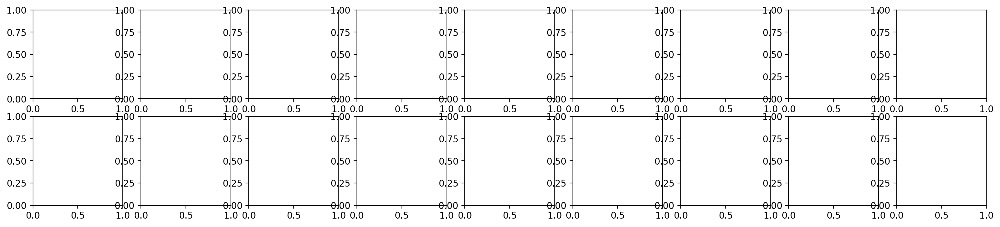

In [7]:
import os
import torch
import numpy as np
import json
from easydict import EasyDict as edict
from test_utils import load_dataset, LoaderSampler, tensor2img
from torchvision.transforms import Compose, Resize, Normalize, ToTensor
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset, DataLoader
from core.my_solver import Solver
from core.fid_score import calculate_frechet_distance
from core.my_metrics import get_Z_pushed_loader_stats, calculate_cost
import matplotlib.pyplot as plt

os.environ['CUDA_VISIBLE_DEVICES'] = "0"


DATASET1, DATASET1_PATH = 'handbag', '../data/handbag_128.hdf5'
DATASET2, DATASET2_PATH = 'shoes', '../data/shoes_128.hdf5'

IMG_SIZE = 128

filename = 'stats/{}_{}_test.json'.format(DATASET2, IMG_SIZE)
with open(filename, 'r') as fp:
    data_stats = json.load(fp)
    mu_data, sigma_data = data_stats['mu'], data_stats['sigma']
del data_stats

device = 'cuda'
input_shape = (3, IMG_SIZE, IMG_SIZE)

torch.manual_seed(0)
np.random.seed(0)

train_loader_a, test_loader_a = load_dataset(DATASET1, DATASET1_PATH,
                                             img_size=IMG_SIZE, batch_size=32)
train_loader_b, test_loader_b = load_dataset(DATASET2, DATASET2_PATH,
                                             img_size=IMG_SIZE, batch_size=32)

n_batches = min(len(train_loader_a), len(train_loader_b))

X_sampler = LoaderSampler(train_loader_a, device=device)
X_test_sampler = LoaderSampler(test_loader_a, device=device)
Y_sampler = LoaderSampler(train_loader_b, device=device)
Y_test_sampler = LoaderSampler(test_loader_b, device=device)

torch.manual_seed(0)
np.random.seed(0)
X_fixed = X_sampler.sample(12)
Y_fixed = Y_sampler.sample(12)

X_test_fixed = X_test_sampler.sample(12)
Y_test_fixed = Y_test_sampler.sample(12)

indices = [i for i in range(1, 10)]
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
                
lambdas_arr = [10.0]
best_iters = [84001]
                
fig, axes = plt.subplots(1 + len(lambdas_arr), len(indices), figsize=(2*len(indices) + 1, 2*len(lambdas_arr) + 2), dpi=200)


for k, lambda_val in enumerate(lambdas_arr):
    args = edict({
    'img_size': 128,
    'num_domains': 2,
    'latent_dim': 16,
    'hidden_dim': 512,
    'style_dim': 64,
    'lambda_reg': 1.0,
    'lambda_cyc': 1.0,
    'lambda_sty': 1.0,
    'lambda_ds': 1.0,
    'lambda_id': lambda_val,
    'ds_iter': 100000,
    'w_hpf': -1.0,
    'randcrop_prob': 0.5,
    'total_iters': 100000,
    'resume_iter': 0,
    'batch_size': 16,
    'val_batch_size': 32,
    'lr': 1e-4,
    'f_lr': 1e-6,
    'beta1': 0.0,
    'beta2': 0.99,
    'weight_decay': 1e-4,
    'num_outs_per_domain': 10,
    'mode': 'train',
    'num_workers': 4,
    'seed': 777,
    'train_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train',
    'val_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test',
    'sample_dir': 'expr/samples',
    'checkpoint_dir': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'eval_dir': 'expr/eval',
    'result_dir': 'expr/results',
    'src_dir': 'assets/representative/celeba_hq/src',
    'ref_dir': 'assets/representative/celeba_hq/ref',
    'inp_dir': 'assets/representative/custom/female',
    'out_dir': 'assets/representative/celeba_hq/src/female',
    'wing_path': 'expr/checkpoints/wing.ckpt',
    'lm_path': 'expr/checkpoints/celeba_lm_mean.npz',
    'print_every': 10,
    'sample_every': 4000,
    'save_every': 4000,
    'eval_every': 4000,
    'device': 0,

    'target_dataset': 'shoes',
    'OUTPUT_PATH': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'domains': {
        'source': 'handbag',
        'target': 'shoes',
    },
    'train_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/handbag',
    'train_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/shoes',
    'test_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/handbag',
    'test_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/shoes',

    'n_epochs': 1
    })
                
    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()

    final_trg_index = -1
    final_src_index = -1

    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                final_trg_index = trg_idx
                final_src_index = src_idx

    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()
    num_domains = len(domains)
    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                print(f"trg_idx = {trg_idx}, trg_domain = {trg_domain}, src_domain = {src_domain}")
                break
        break

    print(f"trg_idx = {trg_idx}, lambda_id = {args.lambda_id}")
                
    solver = Solver(args)
    iteration = best_iters[k]
    solver._load_checkpoint(iteration)
    
    nets_ema = solver.nets_ema
    nets_ema.mapping_network.eval()
    nets_ema.generator.eval()
    
    torch.manual_seed(0xBADBEEF)
    np.random.seed(0xBADBEEF)

In [19]:
from tqdm import tqdm

size = len(X_test_sampler.loader.dataset)
cost_type='mse'
verbose=True

mse_vals = []

cost = 0
for step, (X, _) in tqdm(enumerate(X_test_sampler.loader)) if verbose else enumerate(X_test_sampler.loader):
    x_src = X.to(device)
    N = x_src.size(0)
    y_trg = torch.tensor([trg_idx] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks)
    if cost_type == 'mse':
        cost = list(((x_src - x_fake) ** 2).mean(dim=(1,2,3)).detach().cpu().numpy())
        mse_vals.extend(cost)
        
    elif cost_type == 'l1':
        cost += (F.l1_loss(x_src, x_fake) * X.shape[0]).item()
    else:
        raise Exception('Unknown COST')
    del X, x_fake

434it [01:00,  7.18it/s]


In [21]:
mse_vals_np = np.array(mse_vals)

In [23]:
mse_vals_np.shape

(13876,)

In [25]:
mse_vals_np[mse_vals_np < 0.25].shape

(13785,)

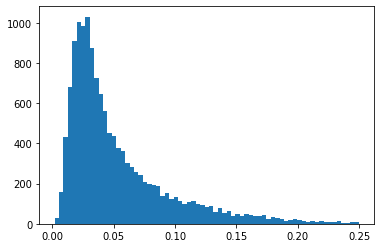

In [26]:
_ = plt.hist(mse_vals_np[mse_vals_np < 0.25], bins='auto')

In [18]:
mse_vals

[0.04384376,
 0.015988167,
 0.058218952,
 0.016005231,
 0.057922285,
 0.019166362,
 0.14145601,
 0.041974097,
 0.049610168,
 0.014431103,
 0.040897533,
 0.11346105,
 0.026930138,
 0.05094328,
 0.045110863,
 0.016249552,
 0.12795864,
 0.013989914,
 0.067130625,
 0.027687756,
 0.07089932,
 0.011209825,
 0.043100517,
 0.016632106,
 0.047178604,
 0.030518174,
 0.031390153,
 0.07114403,
 0.019272175,
 0.11760232,
 0.078002766,
 0.03560604]

(5, 128, 128, 3)
(5, 128, 128, 3)
(5, 128, 128, 3)
(5, 128, 128, 3)
(5, 128, 128, 3)


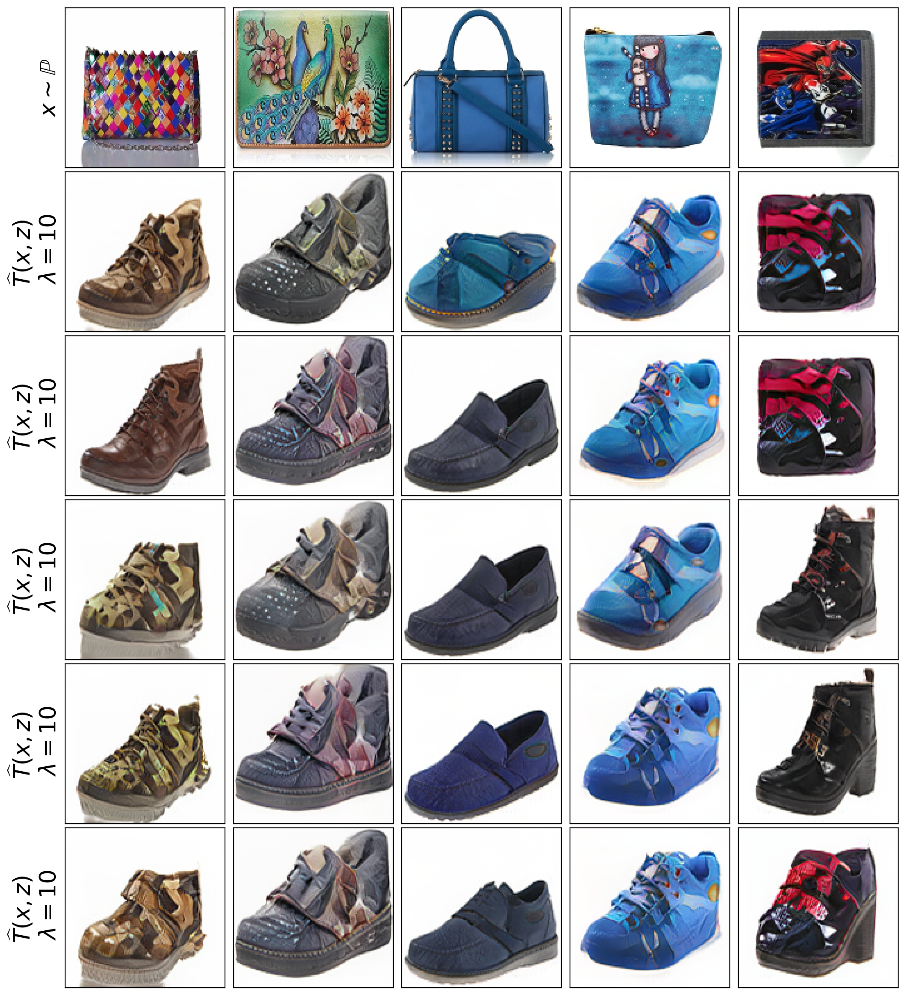

In [32]:
num_examples = 5
fig, axes = plt.subplots(1 + num_examples, len(indices), figsize=(2*len(indices) + 1, 2*num_examples + 2), dpi=200)
torch.manual_seed(0xBADBEEF)
np.random.seed(0xBADBEEF)
indices = [0, 243, 947, 1030, 906]
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
title = r'\widehat{T}(x, z)'

Y_test_fakes = []

Y_test_fakes = []

for v in range(num_examples):
    N = X.size(0)
    x_src = X.to(device)
    y_trg = torch.tensor([final_trg_index] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks).detach()

    fake_Y_test_numpy = tensor2img(x_fake)
    print(fake_Y_test_numpy.shape)
    Y_test_fakes.append(fake_Y_test_numpy)

real_X_test_numpy = tensor2img(X_test_fixed)
real_Y_test_numpy = tensor2img(Y_test_fixed)

real_X_test_numpy = tensor2img(X)

X_tensor = real_X_test_numpy

for j in range(len(indices)):
    axes[0][j].imshow(X_tensor[j])
    axes[0][j].get_xaxis().set_visible(False)
    axes[0][j].set_yticks([])

    for k in range(num_examples):
        axes[k + 1][j].imshow(Y_test_fakes[k][j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])
        axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)

fig.tight_layout(pad=0.001)    

trg_idx = 0, lambda_id = 0.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/tensorboard
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/064001_nets.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/064001_nets_ema.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/064001_optims.ckpt...
(5, 128, 128, 3)
(5, 128, 128, 3)
(5, 128, 128, 3)
(5, 128, 128, 3)
(5, 128, 128, 3)


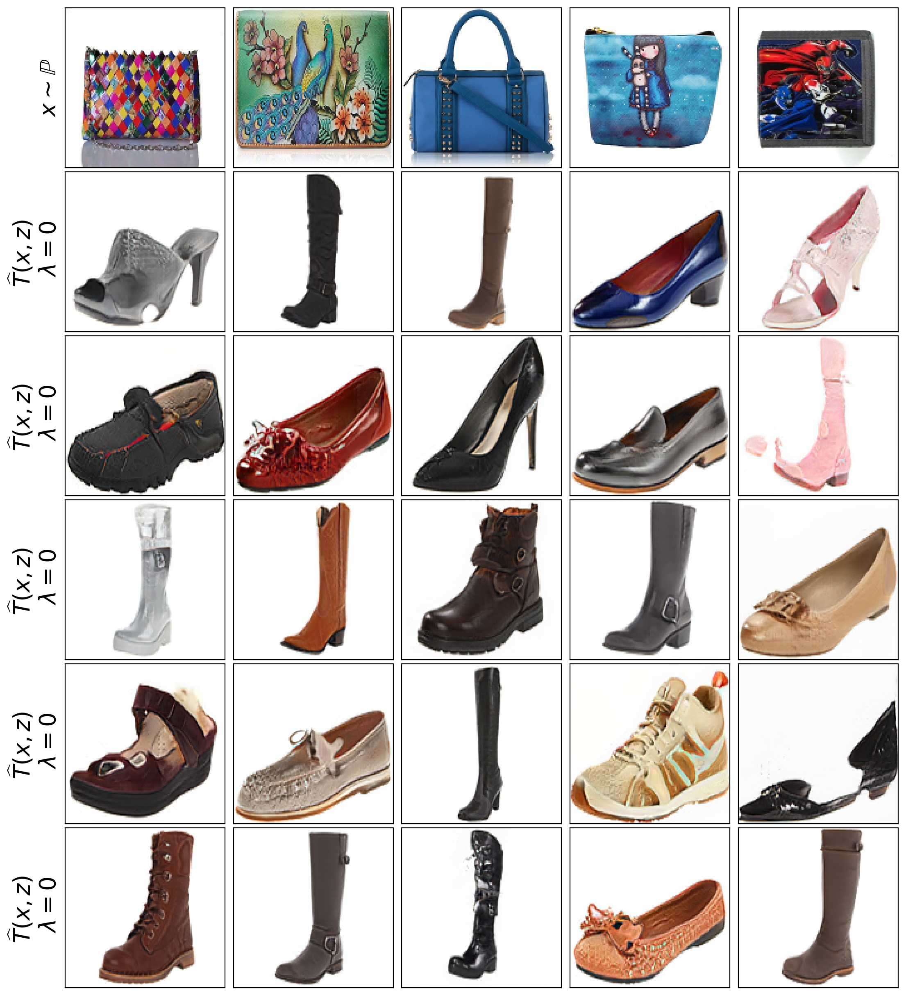

In [35]:
lambdas_arr = [0.0]
best_iters = [64001]

for k, lambda_val in enumerate(lambdas_arr):
    args = edict({
    'img_size': 128,
    'num_domains': 2,
    'latent_dim': 16,
    'hidden_dim': 512,
    'style_dim': 64,
    'lambda_reg': 1.0,
    'lambda_cyc': 1.0,
    'lambda_sty': 1.0,
    'lambda_ds': 1.0,
    'lambda_id': lambda_val,
    'ds_iter': 100000,
    'w_hpf': -1.0,
    'randcrop_prob': 0.5,
    'total_iters': 100000,
    'resume_iter': 0,
    'batch_size': 16,
    'val_batch_size': 32,
    'lr': 1e-4,
    'f_lr': 1e-6,
    'beta1': 0.0,
    'beta2': 0.99,
    'weight_decay': 1e-4,
    'num_outs_per_domain': 10,
    'mode': 'train',
    'num_workers': 4,
    'seed': 777,
    'train_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train',
    'val_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test',
    'sample_dir': 'expr/samples',
    'checkpoint_dir': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'eval_dir': 'expr/eval',
    'result_dir': 'expr/results',
    'src_dir': 'assets/representative/celeba_hq/src',
    'ref_dir': 'assets/representative/celeba_hq/ref',
    'inp_dir': 'assets/representative/custom/female',
    'out_dir': 'assets/representative/celeba_hq/src/female',
    'wing_path': 'expr/checkpoints/wing.ckpt',
    'lm_path': 'expr/checkpoints/celeba_lm_mean.npz',
    'print_every': 10,
    'sample_every': 4000,
    'save_every': 4000,
    'eval_every': 4000,
    'device': 0,

    'target_dataset': 'shoes',
    'OUTPUT_PATH': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'domains': {
        'source': 'handbag',
        'target': 'shoes',
    },
    'train_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/handbag',
    'train_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/shoes',
    'test_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/handbag',
    'test_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/shoes',

    'n_epochs': 1
    })
                
    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()

    final_trg_index = -1
    final_src_index = -1

    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                final_trg_index = trg_idx
                final_src_index = src_idx

    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()
    num_domains = len(domains)
    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                print(f"trg_idx = {trg_idx}, trg_domain = {trg_domain}, src_domain = {src_domain}")
                break
        break

    print(f"trg_idx = {trg_idx}, lambda_id = {args.lambda_id}")
                
    solver = Solver(args)
    iteration = best_iters[k]
    solver._load_checkpoint(iteration)
    
    nets_ema = solver.nets_ema
    nets_ema.mapping_network.eval()
    nets_ema.generator.eval()
    
    torch.manual_seed(0xBADBEEF)
    np.random.seed(0xBADBEEF)
    
num_examples = 5
fig, axes = plt.subplots(1 + num_examples, len(indices), figsize=(2*len(indices) + 1, 2*num_examples + 2), dpi=200)
torch.manual_seed(0xBADBEEF)
np.random.seed(0xBADBEEF)
indices = [0, 243, 947, 1030, 906]
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
title = r'\widehat{T}(x, z)'

Y_test_fakes = []

Y_test_fakes = []

for v in range(num_examples):
    N = X.size(0)
    x_src = X.to(device)
    y_trg = torch.tensor([final_trg_index] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks).detach()

    fake_Y_test_numpy = tensor2img(x_fake)
    print(fake_Y_test_numpy.shape)
    Y_test_fakes.append(fake_Y_test_numpy)

real_X_test_numpy = tensor2img(X_test_fixed)
real_Y_test_numpy = tensor2img(Y_test_fixed)

real_X_test_numpy = tensor2img(X)

X_tensor = real_X_test_numpy

for j in range(len(indices)):
    axes[0][j].imshow(X_tensor[j])
    axes[0][j].get_xaxis().set_visible(False)
    axes[0][j].set_yticks([])

    for k in range(num_examples):
        axes[k + 1][j].imshow(Y_test_fakes[k][j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])
        axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)

fig.tight_layout(pad=0.001)    

trg_idx = 0, lambda_id = 1.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_1.0/tensorboard
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_1.0/096001_nets.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_1.0/096001_nets_ema.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_1.0/096001_optims.ckpt...
(5, 128, 128, 3)
(5, 128, 128, 3)
(5, 128, 128, 3)
(5, 128, 128, 3)
(5, 128, 128, 3)


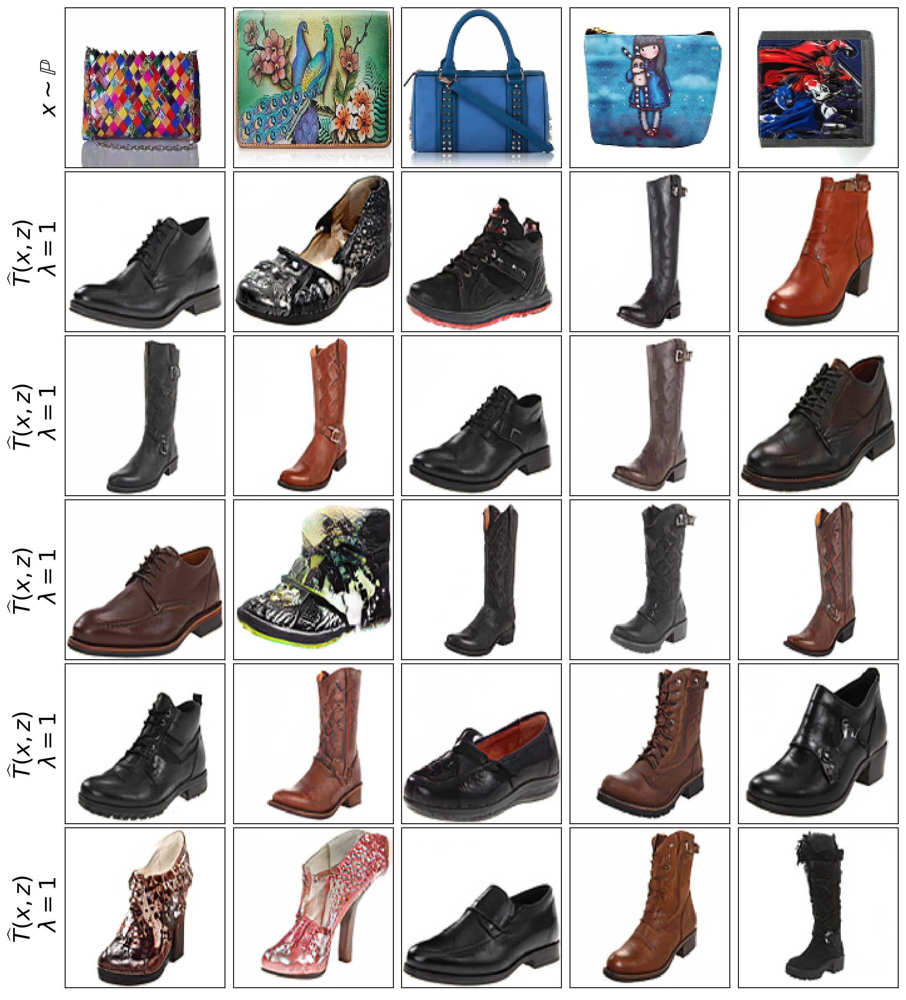

In [36]:
lambdas_arr = [1.0]
best_iters = [96001]

for k, lambda_val in enumerate(lambdas_arr):
    args = edict({
    'img_size': 128,
    'num_domains': 2,
    'latent_dim': 16,
    'hidden_dim': 512,
    'style_dim': 64,
    'lambda_reg': 1.0,
    'lambda_cyc': 1.0,
    'lambda_sty': 1.0,
    'lambda_ds': 1.0,
    'lambda_id': lambda_val,
    'ds_iter': 100000,
    'w_hpf': -1.0,
    'randcrop_prob': 0.5,
    'total_iters': 100000,
    'resume_iter': 0,
    'batch_size': 16,
    'val_batch_size': 32,
    'lr': 1e-4,
    'f_lr': 1e-6,
    'beta1': 0.0,
    'beta2': 0.99,
    'weight_decay': 1e-4,
    'num_outs_per_domain': 10,
    'mode': 'train',
    'num_workers': 4,
    'seed': 777,
    'train_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train',
    'val_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test',
    'sample_dir': 'expr/samples',
    'checkpoint_dir': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'eval_dir': 'expr/eval',
    'result_dir': 'expr/results',
    'src_dir': 'assets/representative/celeba_hq/src',
    'ref_dir': 'assets/representative/celeba_hq/ref',
    'inp_dir': 'assets/representative/custom/female',
    'out_dir': 'assets/representative/celeba_hq/src/female',
    'wing_path': 'expr/checkpoints/wing.ckpt',
    'lm_path': 'expr/checkpoints/celeba_lm_mean.npz',
    'print_every': 10,
    'sample_every': 4000,
    'save_every': 4000,
    'eval_every': 4000,
    'device': 0,

    'target_dataset': 'shoes',
    'OUTPUT_PATH': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'domains': {
        'source': 'handbag',
        'target': 'shoes',
    },
    'train_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/handbag',
    'train_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/shoes',
    'test_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/handbag',
    'test_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/shoes',

    'n_epochs': 1
    })
                
    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()

    final_trg_index = -1
    final_src_index = -1

    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                final_trg_index = trg_idx
                final_src_index = src_idx

    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()
    num_domains = len(domains)
    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                print(f"trg_idx = {trg_idx}, trg_domain = {trg_domain}, src_domain = {src_domain}")
                break
        break

    print(f"trg_idx = {trg_idx}, lambda_id = {args.lambda_id}")
                
    solver = Solver(args)
    iteration = best_iters[k]
    solver._load_checkpoint(iteration)
    
    nets_ema = solver.nets_ema
    nets_ema.mapping_network.eval()
    nets_ema.generator.eval()
    
    torch.manual_seed(0xBADBEEF)
    np.random.seed(0xBADBEEF)
    
num_examples = 5
fig, axes = plt.subplots(1 + num_examples, len(indices), figsize=(2*len(indices) + 1, 2*num_examples + 2), dpi=200)
torch.manual_seed(0xBADBEEF)
np.random.seed(0xBADBEEF)
indices = [0, 243, 947, 1030, 906]
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
title = r'\widehat{T}(x, z)'

Y_test_fakes = []

Y_test_fakes = []

for v in range(num_examples):
    N = X.size(0)
    x_src = X.to(device)
    y_trg = torch.tensor([final_trg_index] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks).detach()

    fake_Y_test_numpy = tensor2img(x_fake)
    print(fake_Y_test_numpy.shape)
    Y_test_fakes.append(fake_Y_test_numpy)

real_X_test_numpy = tensor2img(X_test_fixed)

real_X_test_numpy = tensor2img(X)

X_tensor = real_X_test_numpy

for j in range(len(indices)):
    axes[0][j].imshow(X_tensor[j])
    axes[0][j].get_xaxis().set_visible(False)
    axes[0][j].set_yticks([])

    for k in range(num_examples):
        axes[k + 1][j].imshow(Y_test_fakes[k][j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])
        axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)

fig.tight_layout(pad=0.001)    

(5, 128, 128, 3)
[0.46582806, 0.6452223, 0.41798317, 0.65612185, 0.72551554]


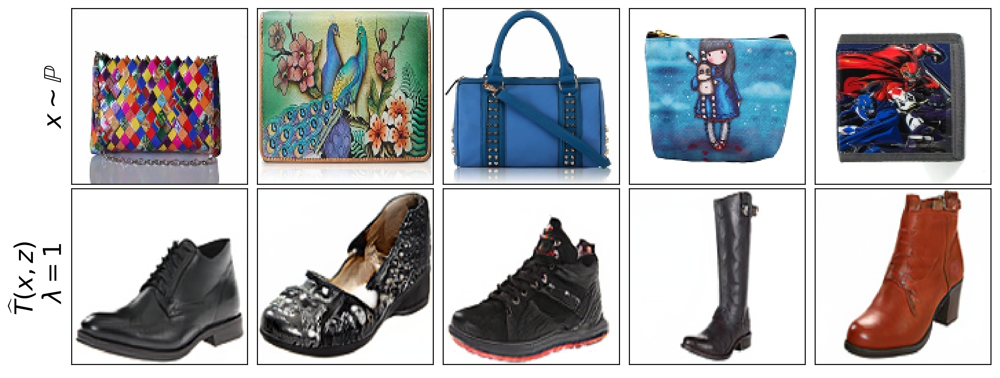

In [59]:
num_examples = 1
fig, axes = plt.subplots(1 + num_examples, len(indices), figsize=(2*len(indices) + 1, 2*num_examples + 2), dpi=200)
torch.manual_seed(0xBADBEEF)
np.random.seed(0xBADBEEF)
indices = [0, 243, 947, 1030, 906]
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
title = r'\widehat{T}(x, z)'

Y_test_fakes = []

Y_test_fakes = []

for v in range(num_examples):
    N = X.size(0)
    x_src = X.to(device)
    y_trg = torch.tensor([final_trg_index] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks).detach()
    
    cost = list(((x_src - x_fake) ** 2).mean(dim=(1,2,3)).detach().cpu().numpy())

    fake_Y_test_numpy = tensor2img(x_fake)
    print(fake_Y_test_numpy.shape)
    Y_test_fakes.append(fake_Y_test_numpy)
    
print(cost)

real_X_test_numpy = tensor2img(X_test_fixed)

real_X_test_numpy = tensor2img(X)

X_tensor = real_X_test_numpy

for j in range(len(indices)):
    axes[0][j].imshow(X_tensor[j])
    axes[0][j].get_xaxis().set_visible(False)
    axes[0][j].set_yticks([])

    for k in range(num_examples):
        axes[k + 1][j].imshow(Y_test_fakes[k][j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])
        axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)
fig.tight_layout(pad=0.001)    

In [60]:
sum(cost)/len(cost)

0.5821341872215271

In [37]:
indices = [0, 243, 947, 1030, 906]
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
title = r'\widehat{T}(x, z)'

Y_test_fakes = []

Y_test_fakes = []

num_examples = 1

for v in range(num_examples):
    N = X.size(0)
    x_src = X.to(device)
    y_trg = torch.tensor([final_trg_index] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks).detach()

    fake_Y_test_numpy = tensor2img(x_fake)
    print(fake_Y_test_numpy.shape)
    Y_test_fakes.append(fake_Y_test_numpy)
    
    cost = list(((x_src - x_fake) ** 2).mean(dim=(1,2,3)).detach().cpu().numpy())
    
print(cost)

(5, 128, 128, 3)
[0.60442567, 0.74746627, 0.46277, 0.5472032, 0.6162366]


In [42]:
from tqdm import tqdm

size = len(X_test_sampler.loader.dataset)
verbose=True

mse_vals = []
l1_vals = []

cost = 0
for step, (X, _) in tqdm(enumerate(X_test_sampler.loader)) if verbose else enumerate(X_test_sampler.loader):
    x_src = X.to(device)
    N = x_src.size(0)
    y_trg = torch.tensor([trg_idx] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks)
    cost = list(((x_src - x_fake) ** 2).mean(dim=(1,2,3)).detach().cpu().numpy())
    mse_vals.extend(cost)
    cost = list(((x_src - x_fake).abs()).mean(dim=(1,2,3)).detach().cpu().numpy())
    l1_vals.extend(cost)

434it [01:01,  7.04it/s]


In [44]:
mse_vals_np = np.array(mse_vals)
l1_vals_np = np.array(l1_vals)
print(np.mean(mse_vals_np))
print(np.mean(l1_vals_np))

0.12783988
0.18393251


In [45]:
X.shape

torch.Size([20, 3, 128, 128])

In [48]:
l1_vals[-20:]

[0.18452315,
 0.26223028,
 0.34040308,
 0.2273762,
 0.23987994,
 0.14625695,
 0.054694846,
 0.28005117,
 0.0679933,
 0.12069555,
 0.24576226,
 0.15092568,
 0.105474345,
 0.14212254,
 0.10407914,
 0.11397465,
 0.072544426,
 0.3163756,
 0.111975834,
 0.22656605]

In [53]:
sum(l1_vals[-20:])/20

0.17569524981081486

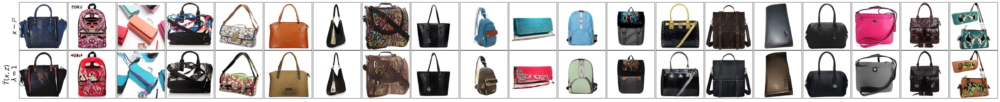

In [54]:
fig, axes = plt.subplots(1 + 1, 20, figsize=(2*20 + 1, 2*1 + 2), dpi=200)
real_X_test_numpy = tensor2img(X)
X_tensor = real_X_test_numpy
x_fake_tensor = tensor2img(x_fake.detach())

for j in range(20):
    axes[0][j].imshow(X_tensor[j])
    axes[0][j].get_xaxis().set_visible(False)
    axes[0][j].set_yticks([])

    for k in range(1):
        axes[k + 1][j].imshow(x_fake_tensor[j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])
        axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)

fig.tight_layout(pad=0.001)    

0it [00:00, ?it/s]


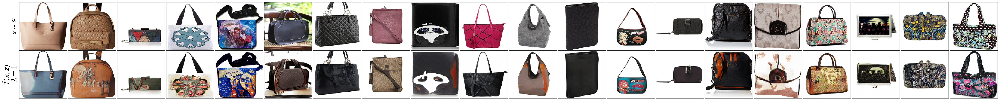

In [61]:
from tqdm import tqdm

size = len(X_test_sampler.loader.dataset)
verbose=True

mse_vals = []
l1_vals = []

cost = 0
for step, (X, _) in tqdm(enumerate(X_test_sampler.loader)) if verbose else enumerate(X_test_sampler.loader):
    x_src = X.to(device)
    N = x_src.size(0)
    y_trg = torch.tensor([trg_idx] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks)
    cost = list(((x_src - x_fake) ** 2).mean(dim=(1,2,3)).detach().cpu().numpy())
    mse_vals.extend(cost)
    cost = list(((x_src - x_fake).abs()).mean(dim=(1,2,3)).detach().cpu().numpy())
    l1_vals.extend(cost)
    break
    
fig, axes = plt.subplots(1 + 1, 20, figsize=(2*20 + 1, 2*1 + 2), dpi=200)
real_X_test_numpy = tensor2img(X)
X_tensor = real_X_test_numpy
x_fake_tensor = tensor2img(x_fake.detach())

for j in range(20):
    axes[0][j].imshow(X_tensor[j])
    axes[0][j].get_xaxis().set_visible(False)
    axes[0][j].set_yticks([])

    for k in range(1):
        axes[k + 1][j].imshow(x_fake_tensor[j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])
        axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)

fig.tight_layout(pad=0.001)    

In [67]:
args.domains

{'source': 'handbag', 'target': 'shoes'}

In [73]:
from core.inception import InceptionV3
from core.my_loader import get_test_loader

def freeze(model):
    for p in model.parameters():
        p.requires_grad_(False)
    model.eval()

dims = 2048
batch_size = 37
n_epochs = 1
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[dims]
model = InceptionV3([block_idx], use_downloaded_weights=True).to(device)
freeze(model)
pred_arr = []

print('Calculating evaluation metrics...')

eval_trg_domain = args.domains['target']
eval_src_domain = args.domains['source']

domains = os.listdir(args.val_img_dir)
domains.sort()
num_domains = len(domains)
print('Number of domains: %d' % num_domains)

for epoch in range(n_epochs):
    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            print(f"src_domain = {src_domain}, eval_src_domain = {eval_src_domain}, trg_domain = {trg_domain}, eval_trg_domain = {eval_trg_domain}")
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                task = '%s2%s' % (src_domain, trg_domain)
                print(f"Compute FID for {task}")
                path_src = args.test_a
                loader_src = get_test_loader(path_src,
                                             img_size=args.img_size,
                                             batch_size=batch_size,
                                             shuffle=False)
                for i, data in enumerate(tqdm(loader_src, total=len(loader_src))):
                    x_src = data[0]
                    N = x_src.size(0)
                    x_src = x_src.to(device)
                    y_trg = torch.tensor([trg_idx] * N).to(device)
                    masks = nets.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

                    z_trg = torch.randn(N, args.latent_dim).to(device)
                    s_trg = nets_ema.mapping_network(z_trg, y_trg)
                    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks)
                    x_fake = x_fake.add(1).mul(.5)
                    pred_arr.append(model(x_fake)[0].cpu().data.numpy().reshape(N, -1))

pred_arr = np.vstack(pred_arr)
mu, sigma = np.mean(pred_arr, axis=0), np.cov(pred_arr, rowvar=False)
torch.cuda.empty_cache()

Calculating evaluation metrics...
Number of domains: 2
src_domain = shoes, eval_src_domain = handbag, trg_domain = handbag, eval_trg_domain = shoes
src_domain = handbag, eval_src_domain = handbag, trg_domain = shoes, eval_trg_domain = shoes
Compute FID for handbag2shoes
Preparing DataLoader for the generation phase...


100%|██████████| 376/376 [01:25<00:00,  4.41it/s]


In [78]:
def get_loader_stats(loader, batch_size=8, n_epochs=1, verbose=False, use_Y=False, use_downloaded_weights=False):
    dims = 2048
    block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[dims]
    model = InceptionV3([block_idx], use_downloaded_weights=use_downloaded_weights).cuda()
    freeze(model)
    
    size = len(loader.dataset)
    pred_arr = []
    
    for epoch in range(n_epochs):
        with torch.no_grad():
            for step, (X, Y) in enumerate(loader) if not verbose else tqdm(enumerate(loader)):
                for i in range(0, len(X), batch_size):
                    start, end = i, min(i + batch_size, len(X))
                    if not use_Y:
                        batch = ((X[start:end] + 1) / 2).type(torch.FloatTensor).cuda()
                    else:
                        batch = ((Y[start:end] + 1) / 2).type(torch.FloatTensor).cuda()
                    pred_arr.append(model(batch)[0].cpu().data.numpy().reshape(end-start, -1))

    pred_arr = np.vstack(pred_arr)
    mu, sigma = np.mean(pred_arr, axis=0), np.cov(pred_arr, rowvar=False)
    return mu, sigma

In [79]:
DATASET_LIST = [
#     ('handbag', '../../data/handbag_128.hdf5', 64, 1),
#     ('handbag', '../../data/handbag_128.hdf5', 128, 1),
#     ('shoes', '../../data/shoes_128.hdf5', 64, 1),
    ('shoes', '../data/shoes_128.hdf5', 128, 1),
#     ('dtd', '../../data/dtd/images', 64, 50),
#     ('celeba_female', '../../data/img_align_celeba', 128, 1),
#     ('aligned_anime_faces', '../../../../../data/aligned_anime_faces', 64, 1),
]


for DATASET, DATASET_PATH, IMG_SIZE, N_EPOCHS in tqdm(DATASET_LIST):
    print('Processing {}'.format(DATASET))
    sampler, test_sampler = load_dataset(DATASET, DATASET_PATH, img_size=IMG_SIZE)
    print('Dataset {} loaded'.format(DATASET))

    mu_data, sigma_data = get_loader_stats(test_sampler, n_epochs=1, use_downloaded_weights=True)

  0%|          | 0/1 [00:00<?, ?it/s]

Processing shoes
Keys: <KeysViewHDF5 ['imgs']>
Dataset shoes loaded


100%|██████████| 1/1 [01:50<00:00, 110.03s/it]


In [80]:
fid = calculate_frechet_distance(mu_data, sigma_data, mu, sigma)
print(f"FID = {fid}")

FID = 45.45320845114526


Keys: <KeysViewHDF5 ['imgs']>
Keys: <KeysViewHDF5 ['imgs']>
trg_idx = 0, lambda_id = 10.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/tensorboard
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_nets.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_nets_ema.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_optims.ckpt...


434it [01:04,  6.77it/s]


l1 = 0.10937653056274199


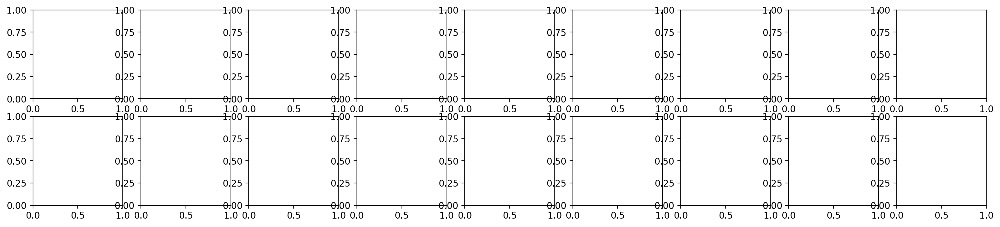

In [102]:
import os
import torch
import numpy as np
import json
from easydict import EasyDict as edict
from test_utils import load_dataset, LoaderSampler, tensor2img
from torchvision.transforms import Compose, Resize, Normalize, ToTensor
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset, DataLoader
from core.my_solver import Solver
from core.fid_score import calculate_frechet_distance
from core.my_metrics import get_Z_pushed_loader_stats, calculate_cost
import matplotlib.pyplot as plt

os.environ['CUDA_VISIBLE_DEVICES'] = "0"


DATASET1, DATASET1_PATH = 'handbag', '../data/handbag_128.hdf5'
DATASET2, DATASET2_PATH = 'shoes', '../data/shoes_128.hdf5'

IMG_SIZE = 128

filename = 'stats/{}_{}_test.json'.format(DATASET2, IMG_SIZE)
with open(filename, 'r') as fp:
    data_stats = json.load(fp)
    mu_data, sigma_data = data_stats['mu'], data_stats['sigma']
del data_stats

device = 'cuda'
input_shape = (3, IMG_SIZE, IMG_SIZE)

torch.manual_seed(0)
np.random.seed(0)

train_loader_a, test_loader_a = load_dataset(DATASET1, DATASET1_PATH,
                                             img_size=IMG_SIZE, batch_size=32)
train_loader_b, test_loader_b = load_dataset(DATASET2, DATASET2_PATH,
                                             img_size=IMG_SIZE, batch_size=32)

n_batches = min(len(train_loader_a), len(train_loader_b))

X_sampler = LoaderSampler(train_loader_a, device=device)
X_test_sampler = LoaderSampler(test_loader_a, device=device)
Y_sampler = LoaderSampler(train_loader_b, device=device)
Y_test_sampler = LoaderSampler(test_loader_b, device=device)

torch.manual_seed(0)
np.random.seed(0)
X_fixed = X_sampler.sample(12)
Y_fixed = Y_sampler.sample(12)

X_test_fixed = X_test_sampler.sample(12)
Y_test_fixed = Y_test_sampler.sample(12)

indices = [i for i in range(1, 10)]
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
                
lambdas_arr = [10.0]
best_iters = [84001]
                
fig, axes = plt.subplots(1 + len(lambdas_arr), len(indices), figsize=(2*len(indices) + 1, 2*len(lambdas_arr) + 2), dpi=200)


for k, lambda_val in enumerate(lambdas_arr):
    args = edict({
    'img_size': 128,
    'num_domains': 2,
    'latent_dim': 16,
    'hidden_dim': 512,
    'style_dim': 64,
    'lambda_reg': 1.0,
    'lambda_cyc': 1.0,
    'lambda_sty': 1.0,
    'lambda_ds': 1.0,
    'lambda_id': lambda_val,
    'ds_iter': 100000,
    'w_hpf': -1.0,
    'randcrop_prob': 0.5,
    'total_iters': 100000,
    'resume_iter': 0,
    'batch_size': 16,
    'val_batch_size': 32,
    'lr': 1e-4,
    'f_lr': 1e-6,
    'beta1': 0.0,
    'beta2': 0.99,
    'weight_decay': 1e-4,
    'num_outs_per_domain': 10,
    'mode': 'train',
    'num_workers': 4,
    'seed': 777,
    'train_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train',
    'val_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test',
    'sample_dir': 'expr/samples',
    'checkpoint_dir': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'eval_dir': 'expr/eval',
    'result_dir': 'expr/results',
    'src_dir': 'assets/representative/celeba_hq/src',
    'ref_dir': 'assets/representative/celeba_hq/ref',
    'inp_dir': 'assets/representative/custom/female',
    'out_dir': 'assets/representative/celeba_hq/src/female',
    'wing_path': 'expr/checkpoints/wing.ckpt',
    'lm_path': 'expr/checkpoints/celeba_lm_mean.npz',
    'print_every': 10,
    'sample_every': 4000,
    'save_every': 4000,
    'eval_every': 4000,
    'device': 0,

    'target_dataset': 'shoes',
    'OUTPUT_PATH': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'domains': {
        'source': 'handbag',
        'target': 'shoes',
    },
    'train_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/handbag',
    'train_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/shoes',
    'test_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/handbag',
    'test_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/shoes',

    'n_epochs': 1
    })
                
    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()

    final_trg_index = -1
    final_src_index = -1

    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                final_trg_index = trg_idx
                final_src_index = src_idx

    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()
    num_domains = len(domains)
    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                print(f"trg_idx = {trg_idx}, trg_domain = {trg_domain}, src_domain = {src_domain}")
                break
        break

    print(f"trg_idx = {trg_idx}, lambda_id = {args.lambda_id}")
                
    solver = Solver(args)
    iteration = best_iters[k]
    solver._load_checkpoint(iteration)
    
    nets_ema = solver.nets_ema
    nets_ema.mapping_network.eval()
    nets_ema.generator.eval()
    
    torch.manual_seed(0xBADBEEF)
    np.random.seed(0xBADBEEF)
    
    l1_cost = calculate_cost(nets_ema, args, trg_idx, X_test_sampler.loader, device,
                   cost_type='l1', verbose=True)
    print(f"l1 = {l1_cost}")
    

In [103]:
from tqdm import tqdm

size = len(X_test_sampler.loader.dataset)
verbose=True

mse_vals = []
l1_vals = []

cost = 0
for step, (X, _) in tqdm(enumerate(X_test_sampler.loader)) if verbose else enumerate(X_test_sampler.loader):
    x_src = X.to(device)
    N = x_src.size(0)
    y_trg = torch.tensor([trg_idx] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks)
    cost = list(((x_src - x_fake) ** 2).mean(dim=(1,2,3)).detach().cpu().numpy())
    mse_vals.extend(cost)
    cost = list(((x_src - x_fake).abs()).mean(dim=(1,2,3)).detach().cpu().numpy())
    l1_vals.extend(cost)
    mse_vals_np = np.array(mse_vals)
l1_vals_np = np.array(l1_vals)
print(np.mean(mse_vals_np))
print(np.mean(l1_vals_np))

434it [01:03,  6.89it/s]

0.054785922
0.109448545


0it [00:00, ?it/s]


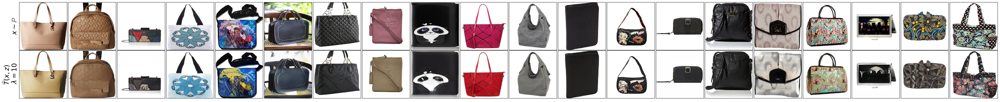

In [92]:
from tqdm import tqdm

size = len(X_test_sampler.loader.dataset)
verbose=True

mse_vals = []
l1_vals = []

cost = 0
for step, (X, _) in tqdm(enumerate(X_test_sampler.loader)) if verbose else enumerate(X_test_sampler.loader):
    x_src = X.to(device)
    N = x_src.size(0)
    y_trg = torch.tensor([trg_idx] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks)
    cost = list(((x_src - x_fake) ** 2).mean(dim=(1,2,3)).detach().cpu().numpy())
    mse_vals.extend(cost)
    cost = list(((x_src - x_fake).abs()).mean(dim=(1,2,3)).detach().cpu().numpy())
    l1_vals.extend(cost)
    break
    
fig, axes = plt.subplots(1 + 1, 20, figsize=(2*20 + 1, 2*1 + 2), dpi=200)
X_tensor = tensor2img(x_src)
x_fake_tensor = tensor2img(x_fake.detach())

for j in range(20):
    axes[0][j].imshow(X_tensor[j])
    axes[0][j].get_xaxis().set_visible(False)
    axes[0][j].set_yticks([])

    for k in range(1):
        axes[k + 1][j].imshow(x_fake_tensor[j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])
        axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)

fig.tight_layout(pad=0.001)   

(5, 128, 128, 3)
[0.17740503, 0.4511034, 0.63073653, 0.25984502, 0.20387742]


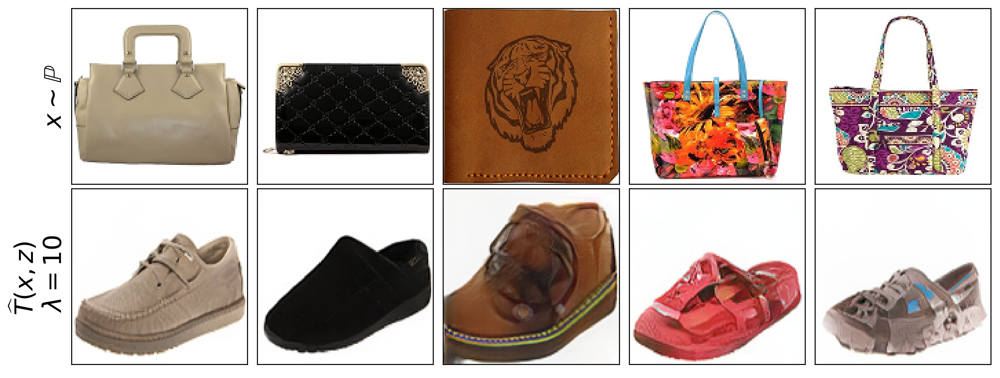

In [91]:
indices = [902, 1002, 1102, 1202, 1302]
num_examples = 1
fig, axes = plt.subplots(1 + num_examples, len(indices), figsize=(2*len(indices) + 1, 2*num_examples + 2), dpi=200)
torch.manual_seed(0xBADBEEF)
np.random.seed(0xBADBEEF)
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
title = r'\widehat{T}(x, z)'

Y_test_fakes = []

Y_test_fakes = []

for v in range(num_examples):
    N = X.size(0)
    x_src = X.to(device)
    y_trg = torch.tensor([final_trg_index] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks).detach()
    
    cost = list(((x_src - x_fake) ** 2).mean(dim=(1,2,3)).detach().cpu().numpy())

    fake_Y_test_numpy = tensor2img(x_fake)
    print(fake_Y_test_numpy.shape)
    Y_test_fakes.append(fake_Y_test_numpy)
    
print(cost)

real_X_test_numpy = tensor2img(X_test_fixed)

real_X_test_numpy = tensor2img(X)

X_tensor = real_X_test_numpy

for j in range(len(indices)):
    axes[0][j].imshow(X_tensor[j])
    axes[0][j].get_xaxis().set_visible(False)
    axes[0][j].set_yticks([])

    for k in range(num_examples):
        axes[k + 1][j].imshow(Y_test_fakes[k][j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])
        axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)
fig.tight_layout(pad=0.001)    

In [93]:
from core.inception import InceptionV3
from core.my_loader import get_test_loader

def freeze(model):
    for p in model.parameters():
        p.requires_grad_(False)
    model.eval()

dims = 2048
batch_size = 37
n_epochs = 1
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[dims]
model = InceptionV3([block_idx], use_downloaded_weights=True).to(device)
freeze(model)
pred_arr = []

print('Calculating evaluation metrics...')

eval_trg_domain = args.domains['target']
eval_src_domain = args.domains['source']

domains = os.listdir(args.val_img_dir)
domains.sort()
num_domains = len(domains)
print('Number of domains: %d' % num_domains)

for epoch in range(n_epochs):
    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            print(f"src_domain = {src_domain}, eval_src_domain = {eval_src_domain}, trg_domain = {trg_domain}, eval_trg_domain = {eval_trg_domain}")
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                task = '%s2%s' % (src_domain, trg_domain)
                print(f"Compute FID for {task}")
                path_src = args.test_a
                loader_src = get_test_loader(path_src,
                                             img_size=args.img_size,
                                             batch_size=batch_size,
                                             shuffle=False)
                for i, data in enumerate(tqdm(loader_src, total=len(loader_src))):
                    x_src = data[0]
                    N = x_src.size(0)
                    x_src = x_src.to(device)
                    y_trg = torch.tensor([trg_idx] * N).to(device)
                    masks = nets.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

                    z_trg = torch.randn(N, args.latent_dim).to(device)
                    s_trg = nets_ema.mapping_network(z_trg, y_trg)
                    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks)
                    x_fake = x_fake.add(1).mul(.5)
                    pred_arr.append(model(x_fake)[0].cpu().data.numpy().reshape(N, -1))

pred_arr = np.vstack(pred_arr)
mu, sigma = np.mean(pred_arr, axis=0), np.cov(pred_arr, rowvar=False)
torch.cuda.empty_cache()

Calculating evaluation metrics...
Number of domains: 2
src_domain = shoes, eval_src_domain = handbag, trg_domain = handbag, eval_trg_domain = shoes
src_domain = handbag, eval_src_domain = handbag, trg_domain = shoes, eval_trg_domain = shoes
Compute FID for handbag2shoes
Preparing DataLoader for the generation phase...


100%|██████████| 376/376 [01:23<00:00,  4.52it/s]


In [94]:
fid = calculate_frechet_distance(mu_data, sigma_data, mu, sigma)
print(f"FID = {fid}")

FID = 22.174046528095857


In [95]:
from tqdm import tqdm

size = len(X_test_sampler.loader.dataset)
verbose=True

mse_vals = []
l1_vals = []

cost = 0
for step, (X, _) in tqdm(enumerate(X_test_sampler.loader)) if verbose else enumerate(X_test_sampler.loader):
    x_src = X.to(device)
    N = x_src.size(0)
    y_trg = torch.tensor([trg_idx] * N).to(device)
    masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

    z_trg = torch.randn(N, args.latent_dim).to(device)
    s_trg = nets_ema.mapping_network(z_trg, y_trg)
    x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks)
    cost = list(((x_src - x_fake) ** 2).mean(dim=(1,2,3)).detach().cpu().numpy())
    mse_vals.extend(cost)
    cost = list(((x_src - x_fake).abs()).mean(dim=(1,2,3)).detach().cpu().numpy())
    l1_vals.extend(cost)

434it [01:01,  7.11it/s]


In [96]:
mse_vals_np = np.array(mse_vals)
l1_vals_np = np.array(l1_vals)
print(np.mean(mse_vals_np))
print(np.mean(l1_vals_np))

0.24286327
0.24386844


In [97]:
l1_cost = calculate_cost(nets_ema, args, trg_idx, X_test_sampler.loader, device,
                   cost_type='l1', verbose=True)
print(f"l1 = {l1_cost}")

434it [01:03,  6.84it/s]


l1 = 0.24330252379771783


Keys: <KeysViewHDF5 ['imgs']>
Keys: <KeysViewHDF5 ['imgs']>
trg_idx = 0, lambda_id = 0.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/tensorboard
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/064001_nets.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/064001_nets_ema.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_0.0/064001_optims.ckpt...


434it [01:02,  6.93it/s]


l1 = 0.5472029480888783


434it [01:02,  6.98it/s]


l2 = 0.6939343573140562
--------
Mean l2 cost = 0.6939343573140562
Std l2 cost = 0.0
--------
Mean l1 cost = 0.5472029480888783
Std l1 cost = 0.0
trg_idx = 0, lambda_id = 1.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_1.0/tensorboard
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_1.0/096001_nets.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_1.0/096001_nets_ema.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_1.0/096001_optims.ckpt...


434it [01:02,  6.99it/s]


l1 = 0.18389558000020248


434it [01:00,  7.18it/s]


l2 = 0.12764857436642243
--------
Mean l2 cost = 0.12764857436642243
Std l2 cost = 0.0
--------
Mean l1 cost = 0.18389558000020248
Std l1 cost = 0.0
trg_idx = 0, lambda_id = 10.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/tensorboard
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_nets.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_nets_ema.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_10.0/084001_optims.ckpt...

434it [01:02,  6.91it/s]


l1 = 0.10937653056274199


434it [01:00,  7.12it/s]


l2 = 0.05478592052450095
--------
Mean l2 cost = 0.05478592052450095
Std l2 cost = 0.0
--------
Mean l1 cost = 0.10937653056274199
Std l1 cost = 0.0
trg_idx = 0, lambda_id = 50.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_50.0/tensorboard
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_50.0/092001_nets.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_50.0/092001_nets_ema.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_50.0/092001_optims.ckpt...

434it [01:01,  7.01it/s]


l1 = 0.06977252818968359


434it [01:00,  7.17it/s]


l2 = 0.02484757095815882
--------
Mean l2 cost = 0.02484757095815882
Std l2 cost = 0.0
--------
Mean l1 cost = 0.06977252818968359
Std l1 cost = 0.0
trg_idx = 0, lambda_id = 200.0
Number of parameters of generator: 33632003
Number of parameters of mapping_network: 2438272
Number of parameters of style_encoder: 20799744
Number of parameters of discriminator: 20735106
Initializing generator...
Initializing mapping_network...
Initializing style_encoder...
Initializing discriminator...
create writer in /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_200.0/tensorboard
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_200.0/092001_nets.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_200.0/092001_nets_ema.ckpt...
Loading checkpoint from /cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_200.0/092001_optims.ck

323it [00:45,  7.14it/s]


KeyboardInterrupt: 

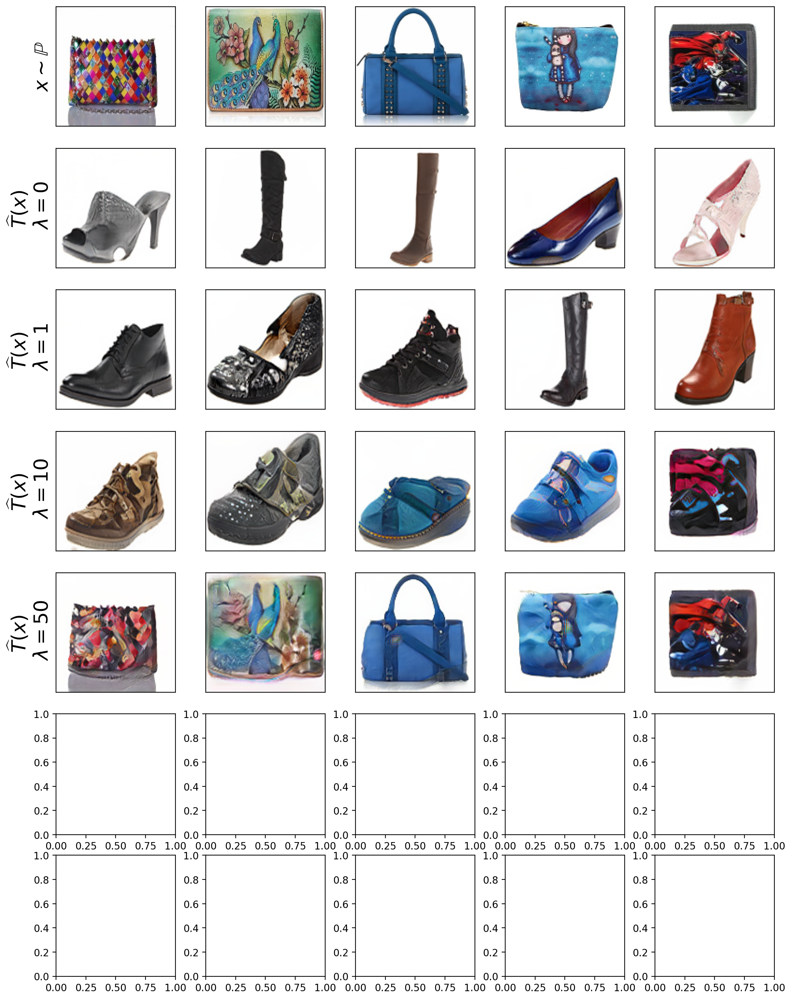

In [101]:
import os
import torch
import numpy as np
import json
from easydict import EasyDict as edict
from test_utils import load_dataset, LoaderSampler, tensor2img
from torchvision.transforms import Compose, Resize, Normalize, ToTensor
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset, DataLoader
from core.my_solver import Solver
from core.fid_score import calculate_frechet_distance
from core.my_metrics import get_Z_pushed_loader_stats, calculate_cost
import matplotlib.pyplot as plt

os.environ['CUDA_VISIBLE_DEVICES'] = "0"


DATASET1, DATASET1_PATH = 'handbag', '../data/handbag_128.hdf5'
DATASET2, DATASET2_PATH = 'shoes', '../data/shoes_128.hdf5'

IMG_SIZE = 128

filename = 'stats/{}_{}_test.json'.format(DATASET2, IMG_SIZE)
with open(filename, 'r') as fp:
    data_stats = json.load(fp)
    mu_data, sigma_data = data_stats['mu'], data_stats['sigma']
del data_stats

device = 'cuda'
input_shape = (3, IMG_SIZE, IMG_SIZE)

torch.manual_seed(0)
np.random.seed(0)

train_loader_a, test_loader_a = load_dataset(DATASET1, DATASET1_PATH,
                                             img_size=IMG_SIZE, batch_size=32)
train_loader_b, test_loader_b = load_dataset(DATASET2, DATASET2_PATH,
                                             img_size=IMG_SIZE, batch_size=32)

n_batches = min(len(train_loader_a), len(train_loader_b))

X_sampler = LoaderSampler(train_loader_a, device=device)
X_test_sampler = LoaderSampler(test_loader_a, device=device)
Y_sampler = LoaderSampler(train_loader_b, device=device)
Y_test_sampler = LoaderSampler(test_loader_b, device=device)

torch.manual_seed(0)
np.random.seed(0)
X_fixed = X_sampler.sample(12)
Y_fixed = Y_sampler.sample(12)

X_test_fixed = X_test_sampler.sample(12)
Y_test_fixed = Y_test_sampler.sample(12)

indices = [0, 243, 947, 1030, 906]
X = torch.stack([test_loader_a.dataset[indices[i]][0].to(device) for i in range(len(indices))])
                
# lambdas_arr = [0.0, 1.0, 10.0, 50.0, 100., 200., 500.]
# best_iters = [64001, 96001, 84001, 92001, 88001, 92001, 88001]
lambdas_arr = [0.0, 1.0, 10.0, 50.0, 200., 500.]
best_iters = [64001, 96001, 84001, 92001,92001, 88001]
                
fig, axes = plt.subplots(1 + len(lambdas_arr), len(indices), figsize=(2*len(indices) + 1, 2*len(lambdas_arr) + 2), dpi=200)


for k, lambda_val in enumerate(lambdas_arr):
    args = edict({
    'img_size': 128,
    'num_domains': 2,
    'latent_dim': 16,
    'hidden_dim': 512,
    'style_dim': 64,
    'lambda_reg': 1.0,
    'lambda_cyc': 1.0,
    'lambda_sty': 1.0,
    'lambda_ds': 1.0,
    'lambda_id': lambda_val,
    'ds_iter': 100000,
    'w_hpf': -1.0,
    'randcrop_prob': 0.5,
    'total_iters': 100000,
    'resume_iter': 0,
    'batch_size': 16,
    'val_batch_size': 32,
    'lr': 1e-4,
    'f_lr': 1e-6,
    'beta1': 0.0,
    'beta2': 0.99,
    'weight_decay': 1e-4,
    'num_outs_per_domain': 10,
    'mode': 'train',
    'num_workers': 4,
    'seed': 777,
    'train_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train',
    'val_img_dir': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test',
    'sample_dir': 'expr/samples',
    'checkpoint_dir': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'eval_dir': 'expr/eval',
    'result_dir': 'expr/results',
    'src_dir': 'assets/representative/celeba_hq/src',
    'ref_dir': 'assets/representative/celeba_hq/ref',
    'inp_dir': 'assets/representative/custom/female',
    'out_dir': 'assets/representative/celeba_hq/src/female',
    'wing_path': 'expr/checkpoints/wing.ckpt',
    'lm_path': 'expr/checkpoints/celeba_lm_mean.npz',
    'print_every': 10,
    'sample_every': 4000,
    'save_every': 4000,
    'eval_every': 4000,
    'device': 0,

    'target_dataset': 'shoes',
    'OUTPUT_PATH': f'/cache/selikhanovych/extremal_ot/stargan-v2/handbag2shoes_exps/checkpoints_lambda_{lambda_val}',
    'domains': {
        'source': 'handbag',
        'target': 'shoes',
    },
    'train_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/handbag',
    'train_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_train/shoes',
    'test_a': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/handbag',
    'test_b': '/cache/selikhanovych/extremal_ot/stargan-v2/data/handbag2shoes_test/shoes',

    'n_epochs': 1
    })
                
    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()

    final_trg_index = -1
    final_src_index = -1

    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                final_trg_index = trg_idx
                final_src_index = src_idx

    eval_trg_domain = args.domains['target']
    eval_src_domain = args.domains['source']

    domains = os.listdir(args.val_img_dir)
    domains.sort()
    num_domains = len(domains)
    for trg_idx, trg_domain in enumerate(domains):
        src_domains = [x for x in domains if x != trg_domain]
        for src_idx, src_domain in enumerate(src_domains):
            if src_domain == eval_src_domain and trg_domain == eval_trg_domain:
                print(f"trg_idx = {trg_idx}, trg_domain = {trg_domain}, src_domain = {src_domain}")
                break
        break

    print(f"trg_idx = {trg_idx}, lambda_id = {args.lambda_id}")
                
    solver = Solver(args)
    iteration = best_iters[k]
    solver._load_checkpoint(iteration)
    
    nets_ema = solver.nets_ema
    nets_ema.mapping_network.eval()
    nets_ema.generator.eval()
    
    torch.manual_seed(0xBADBEEF)
    np.random.seed(0xBADBEEF)
    
    num_calculation_fid = 1
    fid_values = []
    l2_cost_values = []
    l1_cost_values = []

    for i in range(num_calculation_fid):
        # mu, sigma = get_Z_pushed_loader_stats(nets_ema, args.domains, args, device,
        #                                      batch_size=37, n_epochs=args.n_epochs)
        # fid = calculate_frechet_distance(solver.mu_data, solver.sigma_data, mu, sigma)
        # print(f"FID = {fid}")
        # fid_values.append(fid)
        
        l1_cost = calculate_cost(nets_ema, args, trg_idx, X_test_sampler.loader, device,
                   cost_type='l1', verbose=True)
        print(f"l1 = {l1_cost}")
        l1_cost_values.append(l1_cost)
        
        l2_cost = calculate_cost(nets_ema, args, trg_idx, X_test_sampler.loader, device,
                   cost_type='mse', verbose=True)
        print(f"l2 = {l2_cost}")
        l2_cost_values.append(l2_cost)
    
    # # fid_values = np.array(fid_values)
    # fid_mean = np.mean(fid_values)
    # fid_std = np.std(fid_values)
    # print("--------")
    # print(f"Mean FID = {fid_mean}")
    # print(f"Std FID = {fid_std}")
    l2_cost_values = np.array(l2_cost_values)
    l2_cost_mean = np.mean(l2_cost_values)
    l2_cost_std = np.std(l2_cost_values)
    print("--------")
    print(f"Mean l2 cost = {l2_cost_mean}")
    print(f"Std l2 cost = {l2_cost_std}")
    l1_cost_values = np.array(l1_cost_values)
    l1_cost_mean = np.mean(l1_cost_values)
    l1_cost_std = np.std(l1_cost_values)
    print("--------")
    print(f"Mean l1 cost = {l1_cost_mean}")
    print(f"Std l1 cost = {l1_cost_std}")

    torch.manual_seed(0xBADBEEF)
    np.random.seed(0xBADBEEF)

    num_examples = 1
    Y_test_fakes = []

    Y_test_fakes = []

    for v in range(num_examples):
        N = X.size(0)
        x_src = X.to(device)
        y_trg = torch.tensor([final_trg_index] * N).to(device)
        masks = nets_ema.fan.get_heatmap(x_src) if args.w_hpf > 0 else None

        z_trg = torch.randn(N, args.latent_dim).to(device)
        s_trg = nets_ema.mapping_network(z_trg, y_trg)
        x_fake = nets_ema.generator(x=x_src, s=s_trg, masks=masks).detach()

        fake_Y_test_numpy = tensor2img(x_fake)
        Y_test_fakes.append(fake_Y_test_numpy)

    real_X_test_numpy = tensor2img(X_test_fixed)
    real_Y_test_numpy = tensor2img(Y_test_fixed)
    
    real_X_test_numpy = tensor2img(X)

    X_tensor = real_X_test_numpy

    for j in range(len(indices)):
        axes[0][j].imshow(X_tensor[j])
        axes[0][j].get_xaxis().set_visible(False)
        axes[0][j].set_yticks([])

        axes[k + 1][j].imshow(fake_Y_test_numpy[j])
        axes[k + 1][j].get_xaxis().set_visible(False)
        axes[k + 1][j].set_yticks([])

    axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=20)
    title = r'\widehat{T}(x)'
    axes[k + 1, 0].set_ylabel('${}$ \n $\lambda =${}'.format(title, int(lambda_val)), fontsize=20)

    fig.tight_layout(pad=0.001)    
                